ЛАБА 4.

нужно сделать/найти датасет изображений  и обучить/дообучить модель на нем

In [12]:
# Установка необходимых библиотек
!pip install ultralytics --quiet  # Фреймворк для работы с YOLOv8 (тихий режим)
!pip install albumentations --quiet  # Библиотека для аугментации данных (тихий режим)

# Импорт стандартных библиотек
import os  # Работа с файловой системой
import shutil  # Высокоуровневые операции с файлами
import kagglehub  # Взаимодействие с Kaggle API
from pathlib import Path  # Работа с путями в ОС-независимом формате

# Импорт библиотек для обработки данных
import cv2  # Компьютерное зрение (OpenCV)
import numpy as np  # Работа с массивами и матрицами
import matplotlib.pyplot as plt  # Визуализация данных
import seaborn as sns  # Улучшенная визуализация
import random  # Генерация случайных значений

# Импорт метрик из scikit-learn
from sklearn.metrics import (
    roc_auc_score,  # ROC-AUC метрика
    roc_curve,  # Расчет ROC-кривой
    confusion_matrix,  # Матрица ошибок
    precision_recall_curve,  # Precision-Recall кривая
    classification_report,  # Классификационный отчет
    accuracy_score          # Точность (accuracy)
)

# Импорт Albumentations для аугментации данных
import albumentations as A  # Основной модуль
from albumentations.pytorch import ToTensorV2  # Конвертация в тензор PyTorch

# Импорт YOLOv8
from ultralytics import YOLO  # Класс модели YOLO

# Типизация и логирование
from typing import List, Tuple, Optional  # Аннотации типов
# import logging  # Настраиваемое логирование

In [2]:
def setup_kaggle_dataset(force_copy=False):
    """
    Настройка датасета:
    1. Скачивает данные с Kaggle
    2. Копирует их в рабочую директорию
    3. Управляет существующими данными
    
    Args:
        force_copy (bool): Перезаписать данные, если они уже существуют
        
    Returns:
        str: Путь к рабочей директории с данными
    """
    
    # 1. Скачивание датасета через Kaggle API
    source_dir = kagglehub.dataset_download(
        "samuelcortinhas/muffin-vs-chihuahua-image-classification"
    )
    
    # 2. Определение целевой директории (стандартная для Kaggle)
    target_dir = '/kaggle/working/dataset'
    
    # 3. Логика управления существующими данными
    if os.path.exists(target_dir):
        if force_copy:
            print("Перезапись существующих данных...")
            try:
                shutil.rmtree(target_dir)  # Удаляем старую директорию
            except Exception as e:
                logging.error(f"Ошибка при удалении: {e}")
                return None
        else:
            print(f"Данные уже существуют в: {target_dir}")
            return target_dir  # Прерываем выполнение
    
    # 4. Копирование данных
    print("Копирование данных...")
    try:
        shutil.copytree(source_dir, target_dir)  # Рекурсивное копирование
    except Exception as e:
        logging.error(f"Ошибка копирования: {e}")
        return None
    
    print(f"Данные скопированы в: {target_dir}")
    return target_dir

# Пример использования функции
dataset_dir = setup_kaggle_dataset(force_copy=False)  # Без перезаписи
# dataset_dir = setup_kaggle_dataset(force_copy=True)  # С принудительной перезаписью

Копирование данных...
Данные скопированы в: /kaggle/working/dataset


In [3]:
def filter_bboxes(bboxes: List[Tuple[float, float, float, float]], 
                 image_shape: Tuple[int, int]) -> List[Tuple[float, float, float, float]]:
    """
    Фильтрация BBox'ов:
    1. Преобразует YOLO-формат в координаты изображения
    2. Сравнивает площади всех BBox'ов
    3. Возвращает наибольший BBox в YOLO-формате
    
    Параметры:
        bboxes: Список BBox'ов в формате [x_center, y_center, width, height]
        image_shape: Размер изображения (H, W)
        
    Возвращает:
        Список с одним наибольшим BBox или пустой список
    """
    if not bboxes:
        return []
    
    h, w = image_shape[:2]  # Размеры изображения
    max_area = 0
    best_bbox = None
    
    for bbox in bboxes:
        # Преобразование YOLO -> координаты углов
        xc, yc, bw, bh = bbox  # YOLO-формат
        x1 = int((xc - bw/2) * w)  # Левый верхний угол
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)  # Правый нижний угол
        y2 = int((yc + bh/2) * h)
        
        # Расчет площади в пикселях
        area = (x2 - x1) * (y2 - y1)  
        
        # Поиск максимальной площади
        if area > max_area:
            max_area = area
            best_bbox = (x1, y1, x2, y2)
    
    # Если найден подходящий BBox
    if best_bbox:
        x1, y1, x2, y2 = best_bbox
        # Обратное преобразование в YOLO-формат / Нормализация
        xc = (x1 + x2) / (2 * w)
        yc = (y1 + y2) / (2 * h)
        bw = (x2 - x1) / w
        bh = (y2 - y1) / h
        return [(xc, yc, bw, bh)]
    
    return []

def find_largest_object(
    image: np.ndarray, 
    blur_kernel: Tuple[int, int] = (7, 7),
    block_size: int = 15,
    c_param: int = 5,
    morph_kernel: Tuple[int, int] = (9, 9),
    min_area: int = 2000
) -> Optional[Tuple[float, float, float, float]]:
    """
    Поиск крупного объекта через пороговую обработку:
    1. Гауссово размытие для шумоподавления
    2. Адаптивная бинаризация для выделения объектов
    3. Морфология для улучшения маски
    4. Поиск максимального контура
    
    Параметры:
        image: Входное изображение в BGR
        blur_kernel: Размер ядра размытия (четные/нечетные значения влияют на резкость)
        block_size: Размер блока для адаптивного порога (должен быть нечетным)
        c_param: Константа вычитания из среднего в пороге
        morph_kernel: Размер ядра для морф. операций
        min_area: Минимальная площадь контура для рассмотрения
        
    Возвращает:
        BBox в YOLO-формате или None при неудаче
    """
    # 1. Преобразование в градации серого
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 2. Гауссово размытие (подавление шума)
    blurred = cv2.GaussianBlur(gray, blur_kernel, 0)
    
    # 3. Адаптивная пороговая обработка
    thresh = cv2.adaptiveThreshold(
        blurred,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  # Адаптивный метод
        cv2.THRESH_BINARY_INV,           # Инвертированная бинаризация
        blockSize=block_size,            # Размер блока
        C=c_param                        # Константа вычитания
    )
    
    # 4. Морфологическое закрытие (заполнение пробелов)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, morph_kernel)
    morphed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    # 5. Поиск контуров
    contours, _ = cv2.findContours(morphed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # 6. Фильтрация контуров по площади
    largest_contour = None
    max_area = min_area
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > max_area:
            max_area = area
            largest_contour = cnt
            
    if largest_contour is None:
        return None
    
    # 7. Получение BBox и нормализация
    x, y, w, h = cv2.boundingRect(largest_contour)
    h_img, w_img = image.shape[:2]
    
    x_center = (x + w/2) / w_img
    y_center = (y + h/2) / h_img
    width = w / w_img
    height = h / h_img
    
    return (x_center, y_center, width, height)

In [4]:
# Создание пайплайна аугментаций.
def create_augmentation_pipeline(img_size: int = 640) -> A.Compose:
    """
    Создает пайплайн аугментаций с настраиваемым размером изображений.
    
    Параметры:
        img_size: Размер выходного изображения (по умолчанию 640x640)
        
    Возвращает:
        Композицию аугментаций Albumentations
    """
    return A.Compose([
        A.HorizontalFlip(p=0.4),  # Горизонтальное отражение с вероятностью 40%
        A.VerticalFlip(p=0.3), # Вертикальное отражение с вероятностью 40%
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=20, p=0.3),  # Поворот на ±20 градусов с вероятностью 30%
        A.RandomBrightnessContrast(
            brightness_limit=0.2, contrast_limit=0.2, p=0.3),  #Изменение яркости/контраста с вероятностью 30%
        A.RandomResizedCrop(
            height=img_size, width=img_size, scale=(0.8, 1.0), ratio=(0.9, 1.1), p=0.2), #Изменение размера с вероятностью 20%
        A.GaussianBlur(blur_limit=(3, 7), p=0.2),  # Размытие с вероятностью 20%
        A.Resize(img_size, img_size)  # Изменение размера до img_size x img_size
    ], 
    bbox_params=A.BboxParams(
        format='yolo',  # Формат BBox'ов
        label_fields=['class_labels']  # Поле для меток классов
    ))

# Применяет заданное количество аугментаций к изображению и BBox'ам.
def apply_augmentations(
    image: np.ndarray,
    bboxes: List[Tuple[float, float, float, float]],
    class_labels: List[int],
    pipeline: A.Compose,
    num_augmentations: int = 4
) -> List[Tuple[np.ndarray, List[Tuple[float, float, float, float]]]]:
    """
    Применяет заданное количество аугментаций к изображению и BBox'ам.
    
    Параметры:
        image: Исходное изображение (numpy array)
        bboxes: Список исходных BBox'ов в формате YOLO
        class_labels: Список меток классов для каждого BBox'а
        pipeline: Пайплайн аугментаций (A.Compose)
        num_augmentations: Количество аугментированных копий
        
    Возвращает:
        Список кортежей: (изображение, список обновленных BBox'ов)
    """
    augmented = []
    for _ in range(num_augmentations):
        # Применяем аугментации
        transformed = pipeline(
            image=image,
            bboxes=bboxes,
            class_labels=class_labels
        )
        # Сохраняем результат
        augmented.append((transformed['image'], transformed['bboxes']))
    return augmented

def save_augmented_data(
    original_path: Path, # Путь к исходному файлу
    image: np.ndarray, # Аугментированное изображение
    bboxes: List[Tuple[float, float, float, float]], # Список BBox'ов после аугментации
    class_id: int, # ID класса для аннотации
    suffix: str # Суффикс для имени файла (например, "aug0")
) -> None:
    """ Сохраняет аугментированное изображение и аннотацию после фильтрации BBox'ов. """
    # Фильтруем BBox'ы, оставляя только самый большой
    filtered_bboxes = filter_bboxes(bboxes, image.shape)
    
    # Если после фильтрации нет подходящих BBox'ов
    if not filtered_bboxes:
        print(f"Предупреждение: Не найден подходящий bbox для {original_path.stem}_{suffix}")
        return
    
    # Сохраняем изображение
    new_img_path = original_path.parent / f"{original_path.stem}_{suffix}.jpg"
    cv2.imwrite(str(new_img_path), image)
    
    # Сохраняем аннотацию
    txt_path = new_img_path.with_suffix('.txt')
    with open(txt_path, 'w') as f:
        for bbox in filtered_bboxes:
            f.write(f"{class_id} {' '.join(map(str, bbox))}\n")

In [5]:
# Подготовка данных и создание аннотаций YOLO

def create_yolo_annotations(
    dataset_dir: str,  # Путь к директории с датасетом
    img_size: int = 640,  # Размер изображения для аугментации (по умолчанию 640x640)
    num_augmentations: int = 4,  # Количество аугментированных копий для каждого изображения
    apply_augmentation_flag: bool = True  # Флаг для включения/выключения аугментаций
) -> None:
    """
    Создает аннотации в формате YOLO и применяет аугментации.
    Обрабатывает тренировочные и тестовые данные, сохраняет оригинальные и аугментированные аннотации.
    """
    
    # Создаем пайплайн аугментаций, если флаг включен
    aug_pipeline = create_augmentation_pipeline(img_size) if apply_augmentation_flag else None
    
    # Проходим по разделам датасета: train и test
    for split in ['train', 'test']:
        # Обрабатываем каждый класс: chihuahua и muffin
        for class_name in ['chihuahua', 'muffin']:
            # Определяем ID класса
            class_id = 0 if class_name == 'chihuahua' else 1
            
            # Строим путь к директории класса
            class_dir = Path(dataset_dir) / split / class_name
            
            # Проходим по всем изображениям в директории класса
            for img_path in class_dir.glob('*.jpg'):
                # Пропускаем уже аугментированные файлы (с суффиксом '_aug')
                if '_aug' in img_path.stem:
                    continue
                
                # Читаем изображение
                img = cv2.imread(str(img_path))
                h, w = img.shape[:2]  # Получаем размеры изображения
                
                # Находим крупный объект на изображении
                main_bbox = find_largest_object(
                    img,
                    blur_kernel=(7, 7),  # Ядро размытия для шумоподавления
                    block_size=15,       # Размер блока для адаптивной пороговой обработки
                    c_param=5,           # Константа вычитания из среднего
                    morph_kernel=(9, 9), # Ядро для морфологических операций
                    min_area=2000        # Минимальная площадь объекта
                )
                
                # Если объект не найден, пропускаем изображение
                if main_bbox is None:
                    print(f"Объект не найден: {img_path}")
                    continue
                
                # Сохраняем оригинальные аннотации, если их еще нет
                original_txt_path = img_path.with_suffix('.txt')  # Заменяем расширение на .txt
                if not original_txt_path.exists():
                    # Фильтруем BBox'ы (оставляем только самый большой)
                    filtered_main = filter_bboxes([main_bbox], img.shape)
                    
                    # Если после фильтрации есть подходящий BBox, сохраняем его
                    if filtered_main:
                        with open(original_txt_path, 'w') as f:
                            f.write(f"{class_id} {' '.join(map(str, filtered_main[0]))}")
                
                # Применяем аугментации только для тренировочных данных
                if split == 'train' and apply_augmentation_flag:
                    # Генерируем аугментированные версии изображения
                    augmented = apply_augmentations(
                        img,                  # Исходное изображение
                        [main_bbox],          # Исходный BBox
                        [class_id],           # Метка класса
                        aug_pipeline,         # Пайплайн аугментаций
                        num_augmentations=num_augmentations  # Количество аугментаций
                    )
                    
                    # Сохраняем каждую аугментированную версию
                    for i, (aug_img, aug_bboxes) in enumerate(augmented):
                        save_augmented_data(
                            img_path,          # Путь к исходному изображению
                            aug_img,           # Аугментированное изображение
                            aug_bboxes,        # Аугментированные BBox'ы
                            class_id,          # ID класса
                            f"aug{i}"          # Суффикс для имени файла
                        )

# Создаем аннотации для всего датасета
create_yolo_annotations(dataset_dir)

Объект не найден: /kaggle/working/dataset/train/chihuahua/img_4_968.jpg
Объект не найден: /kaggle/working/dataset/train/chihuahua/img_0_642.jpg
Объект не найден: /kaggle/working/dataset/train/chihuahua/img_2_369.jpg
Объект не найден: /kaggle/working/dataset/train/chihuahua/img_4_93.jpg
Объект не найден: /kaggle/working/dataset/train/chihuahua/img_1_234.jpg
Объект не найден: /kaggle/working/dataset/test/chihuahua/img_0_609.jpg
Объект не найден: /kaggle/working/dataset/test/chihuahua/img_1_153.jpg


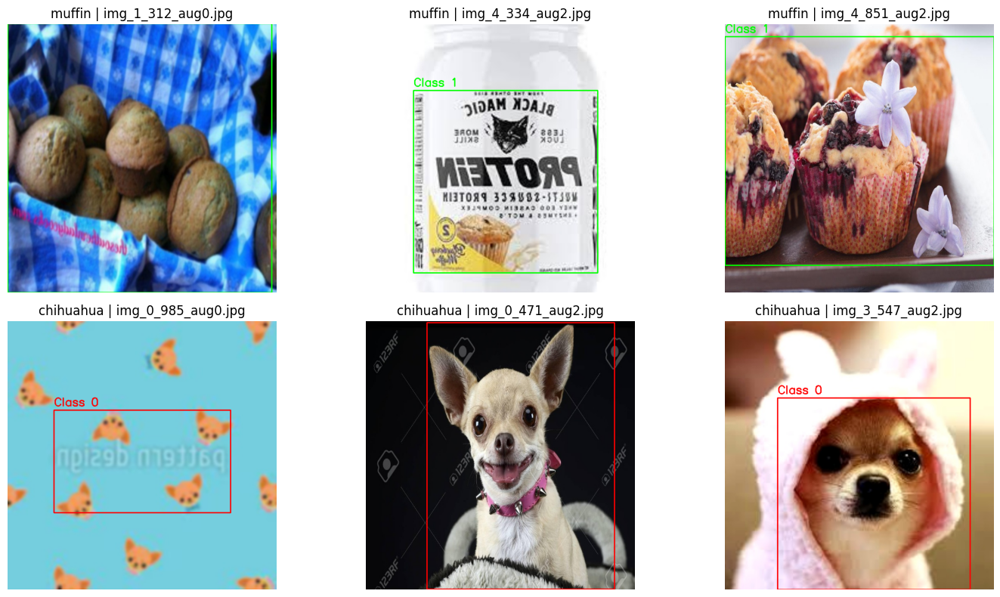

In [24]:
def visualize_random_images(dataset_dir, num_samples=3):
    """
    Визуализирует случайные изображения с их аннотациями для каждого класса.
    Отображает bounding boxes и метки классов на изображениях.
    """
    
    # Определяем классы и их папки
    classes = {
        0: 'chihuahua',
        1: 'muffin'
    }

    # Создаем фигуру для отображения
    fig, axes = plt.subplots(len(classes), num_samples, figsize=(15, 8))

    for class_id, class_name in classes.items():
        # Получаем список всех изображений класса в тренировочной выборке
        class_dir = Path(dataset_dir) / 'train' / class_name
        image_paths = list(class_dir.glob('*.jpg'))

        # Проверяем, есть ли изображения
        if not image_paths:
            print(f"Изображения для класса {class_name} не найдены")
            continue

        # Выбираем случайные изображения
        random_samples = random.sample(image_paths, min(num_samples, len(image_paths)))

        for i, img_path in enumerate(random_samples):
            # Загружаем изображение
            img = cv2.imread(str(img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h, w = img.shape[:2]

            # Загружаем аннотации
            txt_path = img_path.with_suffix('.txt')
            if not txt_path.exists():
                print(f"Аннотация для {img_path.name} не найдена")
                continue

            with open(txt_path, 'r') as f:
                annotations = f.readlines()

            # Отрисовываем bounding boxes
            for ann in annotations:
                class_id_ann, xc, yc, w_norm, h_norm = map(float, ann.strip().split())

                # Преобразуем нормализованные координаты в пиксели
                x_center = int(xc * w)
                y_center = int(yc * h)
                box_w = int(w_norm * w)
                box_h = int(h_norm * h)

                x1 = x_center - box_w // 2
                y1 = y_center - box_h // 2
                x2 = x_center + box_w // 2
                y2 = y_center + box_h // 2

                # Отрисовываем прямоугольник
                color = (0, 255, 0) if class_id_ann == 1 else (255, 0, 0)
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                cv2.putText(img, f'Class {int(class_id_ann)}', (x1, y1-10),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

            # Отображаем изображение
            ax = axes[class_id-1][i]
            ax.imshow(img)
            ax.set_title(f'{class_name} | {img_path.name}')
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Пример использования
visualize_random_images(dataset_dir, num_samples=3)

In [7]:
# Блок 3: Конфигурация YOLO
def train_yolo(dataset_dir):
    """
    Обучает модель YOLO на заданном датасете.
    Создает конфигурационный файл, загружает предобученную модель и выполняет обучение.
    """

    # Настройка уровня логирования для библиотеки Ultralytics
    # logging.getLogger('ultralytics').setLevel(logging.WARNING)
    """
    - Устанавливаем уровень логирования на WARNING, 
    чтобы уменьшить количество информационных сообщений.
    """

    # Создаем файл данных YOLO в формате YAML
    data_yaml = f"""
    train: {dataset_dir}/train  # Путь к тренировочной выборке
    val: {dataset_dir}/test     # Путь к тестовой выборке
    nc: 2                       # Количество классов (chihuahua и muffin)
    names: ['chihuahua', 'muffin']  # Имена классов
    """

    with open('data.yaml', 'w') as f:
        f.write(data_yaml)

    # Загружаем предобученную модель YOLO
    model = YOLO('/kaggle/input/yolov12n/yolov12n.pt')

    # Обучение модели
    results = model.train(
        data='data.yaml',      # Путь к файлу конфигурации данных
        epochs=20,             # Количество эпох для обучения
        imgsz=640,             # Размер входного изображения (640x640)
        batch=64,              # Размер батча (количество изображений за одну итерацию)
        name='muffin-chihuahua'  # Имя эксперимента (для сохранения результатов)
    ) 
    return model

# Запуск обучения
model = train_yolo(dataset_dir)

Ultralytics 8.3.105 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/yolov12n/yolov12n.pt, data=data.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=muffin-chihuahua, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|██████████| 755k/755k [00:00<00:00, 17.8MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      2368  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2, 1, 2]          
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2, 1, 4]          
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.6MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/dataset/train/chihuahua... 18912 images, 5 backgrounds, 0 corrupt: 100%|██████████| 18917/18917 [00:15<00:00, 1248.79it/s]


train: New cache created: /kaggle/working/dataset/train/chihuahua.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/test/chihuahua... 1182 images, 2 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:01<00:00, 1173.46it/s]


val: New cache created: /kaggle/working/dataset/test/chihuahua.cache
Plotting labels to runs/detect/muffin-chihuahua/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/muffin-chihuahua
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.54G      0.938       1.99       1.76          5        640: 100%|██████████| 592/592 [05:54<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:12<00:00,  1.57it/s]

                   all       1184       1182      0.635      0.632      0.657      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      7.15G     0.8527      1.026      1.662          5        640: 100%|██████████| 592/592 [05:50<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.82it/s]

                   all       1184       1182       0.78       0.78      0.813      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      7.15G     0.8037     0.8959      1.615          5        640: 100%|██████████| 592/592 [05:45<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.82it/s]

                   all       1184       1182      0.507      0.643      0.528      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      7.15G     0.7597     0.8175       1.57          5        640: 100%|██████████| 592/592 [05:44<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.83it/s]

                   all       1184       1182      0.843      0.799      0.848      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.15G     0.7162     0.7409       1.52          5        640: 100%|██████████| 592/592 [05:45<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.83it/s]

                   all       1184       1182      0.827      0.838      0.879      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      7.15G     0.6743     0.6935      1.484          4        640: 100%|██████████| 592/592 [05:45<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.83it/s]

                   all       1184       1182      0.802      0.816      0.863      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      7.15G     0.6443     0.6499      1.453          5        640: 100%|██████████| 592/592 [05:45<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.82it/s]

                   all       1184       1182      0.865      0.824      0.892      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.15G      0.606      0.605      1.419          5        640: 100%|██████████| 592/592 [05:45<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.81it/s]

                   all       1184       1182      0.874      0.829      0.906      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      7.15G     0.5826     0.5686      1.389          5        640: 100%|██████████| 592/592 [05:45<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.79it/s]

                   all       1184       1182      0.893      0.854      0.923      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.15G     0.5566     0.5363      1.369          5        640: 100%|██████████| 592/592 [05:45<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.84it/s]

                   all       1184       1182      0.885      0.866      0.926      0.768



10 epochs completed in 0.996 hours.
Optimizer stripped from runs/detect/muffin-chihuahua/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/muffin-chihuahua/weights/best.pt, 5.4MB

Validating runs/detect/muffin-chihuahua/weights/best.pt...
Ultralytics 8.3.105 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,527,166 parameters, 0 gradients, 5.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:11<00:00,  1.69it/s]


                   all       1184       1182      0.885      0.866      0.926      0.768
             chihuahua        638        638      0.865      0.837      0.905       0.75
                muffin        544        544      0.905      0.895      0.947      0.787


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 5.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/muffin-chihuahua


In [19]:
# Путь к исходной директории
source_dir = '/kaggle/working/runs'
# Путь к ZIP-файлу
output_zip = '/kaggle/working/muffin-chihuahua/result.zip'

# Создание ZIP-архива
shutil.make_archive(output_zip.replace('.zip', ''), 'zip', source_dir)

print("Архив создан:", output_zip)

Архив создан: /kaggle/working/muffin-chihuahua/result.zip


Ultralytics 8.3.105 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /kaggle/working/dataset/test/chihuahua.cache... 1182 images, 2 backgrounds, 0 corrupt: 100%|██████████| 1184/1184 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 37/37 [00:10<00:00,  3.57it/s]


                   all       1184       1182      0.886      0.868      0.926      0.769
             chihuahua        638        638      0.868      0.838      0.904      0.749
                muffin        544        544      0.903      0.897      0.947      0.789


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.4ms preprocess, 4.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/muffin-chihuahua6
mAP@0.5: 0.93
mAP@0.5:0.95: 0.77
Precision: 0.89
Recall: 0.87

Classification Report:
              precision    recall  f1-score   support

   Chihuahua       0.90      0.98      0.94       640
      Muffin       0.98      0.88      0.92       544

    accuracy                           0.93      1184
   macro avg       0.94      0.93      0.93      1184
weighted avg       0.94      0.93      0.93      1184

Accuracy: 0.93

ROC AUC: 0.9782


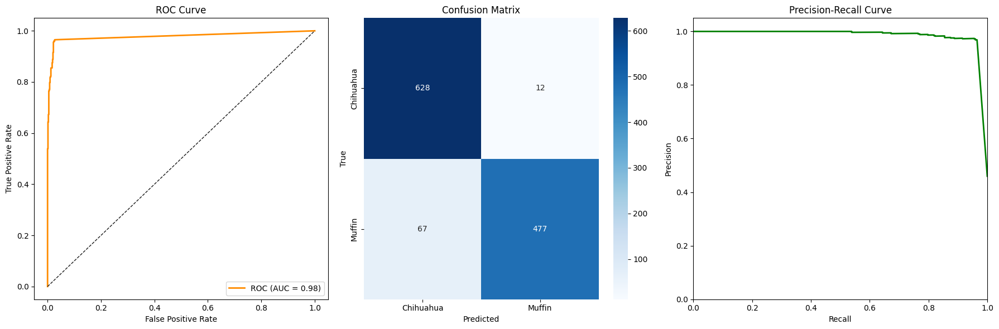

In [13]:
def evaluate_model(model, dataset_dir):
    """
    Оценивает производительность модели YOLOv8 на тестовом наборе данных.
    Включает метрики mAP, Precision, Recall, ROC AUC, а также визуализацию результатов.
    """
    # Валидация модели и вывод основных метрик
    metrics = model.val()
    print(f"mAP@0.5: {metrics.box.map50:.2f}")    # Используем метод map50()
    print(f"mAP@0.5:0.95: {metrics.box.map:.2f}")  # Используем метод map()
    print(f"Precision: {metrics.box.mp:.2f}")
    print(f"Recall: {metrics.box.mr:.2f}")

    # Подготовка данных для метрик классификации
    test_dir = Path(dataset_dir) / 'test'
    y_true = []  # Истинные метки (0: chihuahua, 1: muffin)
    y_scores = []  # Уверенность модели в классе 1 (muffin)
    y_pred = []  # Предсказанные метки (0 или 1)

    for class_name in ['chihuahua', 'muffin']:
        class_id = 0 if class_name == 'chihuahua' else 1
        class_dir = test_dir / class_name

        for img_path in class_dir.glob('*.jpg'):
            results = model.predict(img_path, verbose=False)
            max_conf_class1 = 0.0  # Максимальная уверенность в классе muffin (1)

            if results[0].boxes is not None:
                for box in results[0].boxes:
                    conf = box.conf.item()
                    cls = int(box.cls.item())
                    if cls == 1:  # Учитываем только уверенность в muffin
                        max_conf_class1 = max(max_conf_class1, conf)

            y_score = max_conf_class1
            y_true.append(class_id)
            y_scores.append(y_score)
            y_pred.append(1 if y_score > 0.5 else 0)  # Порог 0.5 для классификации

    # Вывод дополнительных метрик классификации
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=['Chihuahua', 'Muffin']))
    print(f"Accuracy: {accuracy_score(y_true, y_pred):.2f}")

    # Расчет ROC AUC
    roc_auc = roc_auc_score(y_true, y_scores)
    print(f"\nROC AUC: {roc_auc:.4f}")

    # Визуализация
    plt.figure(figsize=(18, 6))

    # ROC-кривая
    plt.subplot(1, 3, 1)
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')

    # Confusion Matrix
    plt.subplot(1, 3, 2)
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Chihuahua', 'Muffin'],
                yticklabels=['Chihuahua', 'Muffin'])
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')

    # Precision-Recall кривая
    plt.subplot(1, 3, 3)
    prec, rec, _ = precision_recall_curve(y_true, y_scores)
    plt.plot(rec, prec, color='green', lw=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])

    plt.tight_layout()
    plt.show()

# Запуск оценки
evaluate_model(model, dataset_dir)

In [14]:
# Корректное сохранение весов YOLO
def save_model_weights(model: YOLO, output_dir: str = 'model_weights') -> Path:
    """
    Сохраняет веса модели YOLO в указанную директорию.
    Возвращает путь к сохраненному файлу.
    """
    
    output_path = Path(output_dir)
    output_path.mkdir(parents=True, exist_ok=True)
    weights_path = output_path / 'best.pt'
    model.save(str(weights_path))  # Правильный метод сохранения
    return weights_path

# Пример использования
save_model_weights(model, '/kaggle/working/model_weights')

PosixPath('/kaggle/working/model_weights/best.pt')

In [20]:
# Вычисление Intersection over Union для двух bbox
def bbox_iou(box1, box2):
    """
    Вычисляет метрику IoU (Intersection over Union) для двух bounding box'ов.
    Формат bbox: [x1, y1, x2, y2], где:
    - (x1, y1): Левый верхний угол.
    - (x2, y2): Правый нижний угол.
    """
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA) * max(0, yB - yA)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    
    return inter_area / (box1_area + box2_area - inter_area + 1e-9)

# Объединение пересекающихся bounding box'ов
def merge_boxes(detections, iou_threshold=0.5):
    """
    Объединяет пересекающиеся bounding box'ы на основе IoU.
    Входные данные:
    - detections: Список bbox'ов в формате [x1, y1, x2, y2, confidence, class_id].
    - iou_threshold: Пороговое значение IoU для объединения.
    """
    # Если список bbox'ов пуст, возвращаем пустой список
    if not detections:
        return []
        
    # Сначала сортируем по уверенности
    detections.sort(key=lambda x: x[4], reverse=True)
    merged = [detections[0]]
    
    for current in detections[1:]:
        combined = False
        for i, existing in enumerate(merged):
            # Проверяем принадлежность к одному классу
            if current[5] != existing[5]:
                continue
                
            iou = bbox_iou(current[:4], existing[:4])
            if iou > iou_threshold:
                # Объединяем bbox'ы
                new_box = [
                    min(current[0], existing[0]),  # Минимальный x1
                    min(current[1], existing[1]),  # Минимальный y1
                    max(current[2], existing[2]),  # Максимальный x2
                    max(current[3], existing[3]),  # Максимальный y2
                    max(current[4], existing[4]),  # Сохраняем максимальную уверенность
                    current[5] # ID класса
                ]
                merged[i] = new_box
                combined = True
                break
        if not combined:
            merged.append(current)
    return merged

In [16]:
# Классификация изображений с объединением пересекающихся bbox
def classify_with_saved_weights(weights_path, image_dir, conf_threshold=0.25, 
                              max_images=24, iou_threshold=0.5):
    """
    Функция загружает модель YOLO с сохраненными весами и выполняет детекцию объектов
    на изображениях. Пересекающиеся bounding box'ы объединяются, а результаты визуализируются.
    """
    # Загрузка модели YOLO с указанными весами
    model = YOLO(weights_path)
    # Получение списка изображений в директории
    image_paths = list(Path(image_dir).glob('*.jpg'))[:max_images]

    # Обработка каждого изображения
    for img_path in image_paths:
        img = cv2.imread(str(img_path))
        results = model.predict(img, conf=conf_threshold, verbose=False)
        
        # Получаем исходные детекции
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confs = results[0].boxes.conf.cpu().numpy()
        classes = results[0].boxes.cls.cpu().numpy()
        
        # Формируем список детекций в формате [x1, y1, x2, y2, conf, class]
        detections = []
        for box, conf, cls in zip(boxes, confs, classes):
            detections.append([*box, conf, int(cls)])
        
        # Объединяем пересекающиеся bbox'ы
        merged_detections = merge_boxes(detections, iou_threshold)
        
        # Визуализация
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Image: {img_path.name}")

        # Отрисовка каждого объединенного bbox'а
        for det in merged_detections:
            x1, y1, x2, y2, conf, cls = det
            label = 'Chihuahua' if cls == 0 else 'Muffin'
            color = (0, 1, 0) if cls == 0 else (1, 0, 0)
            
            # Рисуем bounding box
            rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, 
                                fill=False, edgecolor=color, lw=2)
            plt.gca().add_patch(rect)
            
            # Добавляем подпись
            plt.text(x1, y1-5, 
                    f"{label} {conf:.2f}", 
                    color='white', 
                    fontsize=10,
                    bbox=dict(facecolor=color, edgecolor=color, pad=0, alpha=0.8))

        # Отключение осей и отображение графика
        plt.axis('off')
        plt.show()
        
        # Текстовый вывод
        print(f"\n{'='*40}")
        print(f"Image: {img_path.name}")
        print(f"Original detections: {len(detections)}, Merged: {len(merged_detections)}")

        # Вывод подробной информации о каждом объединенном bbox'е
        for i, det in enumerate(merged_detections):
            x1, y1, x2, y2, conf, cls = det
            label = 'Chihuahua' if cls == 0 else 'Muffin'
            print(f"\nObject {i+1}:")
            print(f"  Class: {label}")
            print(f"  Confidence: {conf:.2f}")
            print(f"  BBox: [x1={x1:.0f}, y1={y1:.0f}, x2={x2:.0f}, y2={y2:.0f}]")
            print(f"  Size: {x2-x1:.0f}x{y2-y1:.0f} px")

In [ ]:
classify_with_saved_weights(
    weights_path='/kaggle/working/model_weights/best.pt',
    image_dir='/kaggle/input/muffin-vs-chihuahua-image-classification/test/chihuahua',
    conf_threshold=0.3,
    max_images=8,
    iou_threshold=0.5
)

classify_with_saved_weights(
    weights_path='/kaggle/working/model_weights/best.pt',
    image_dir='/kaggle/input/muffin-vs-chihuahua-image-classification/test/muffin',
    conf_threshold=0.3,
    max_images=8,
    iou_threshold=0.5
)

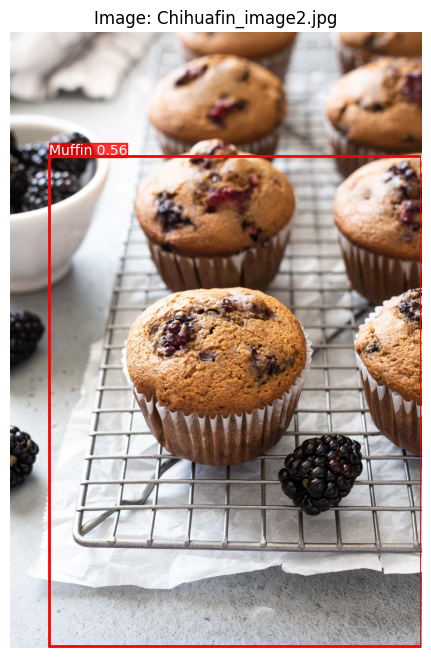


Image: Chihuafin_image2.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.56
  BBox: [x1=113, y1=362, x2=1198, y2=1791]
  Size: 1085x1429 px


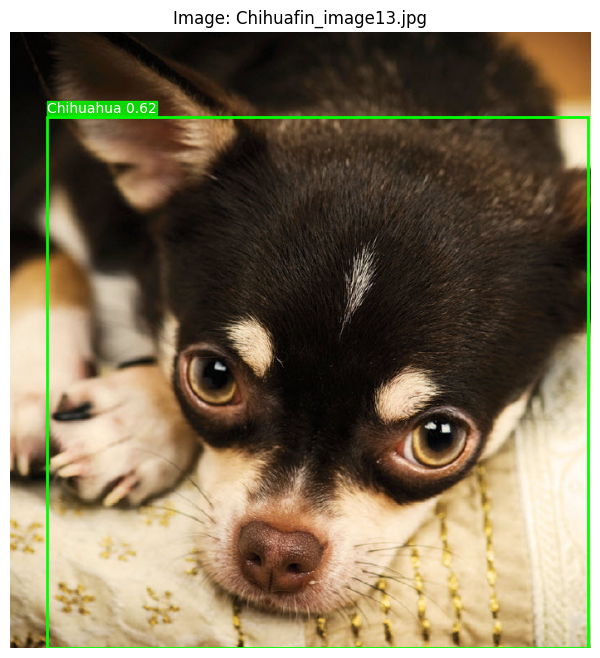


Image: Chihuafin_image13.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.62
  BBox: [x1=44, y1=101, x2=696, y2=743]
  Size: 652x642 px


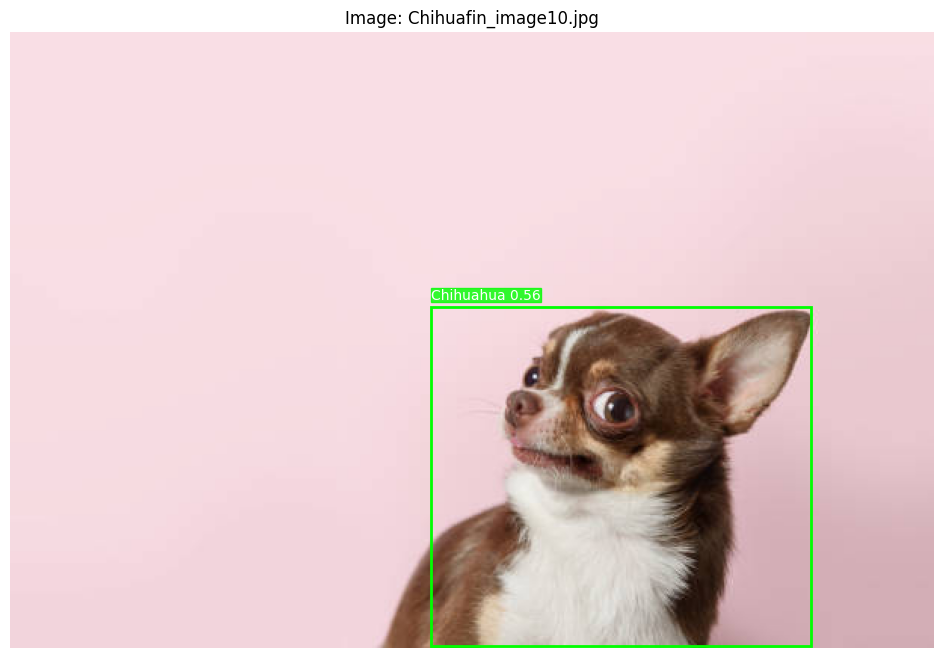


Image: Chihuafin_image10.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.56
  BBox: [x1=278, y1=182, x2=530, y2=406]
  Size: 252x224 px


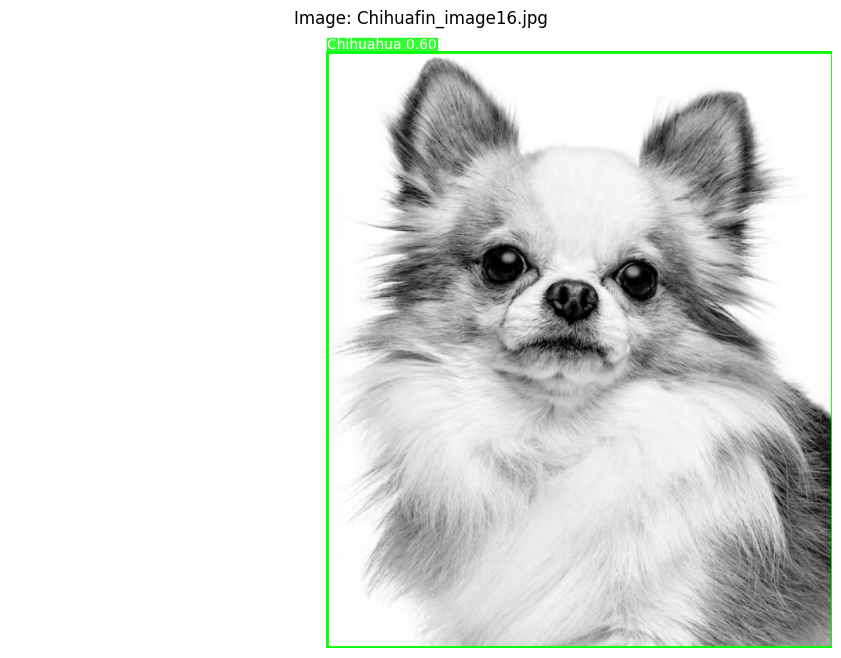


Image: Chihuafin_image16.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.60
  BBox: [x1=449, y1=28, x2=1166, y2=871]
  Size: 717x843 px


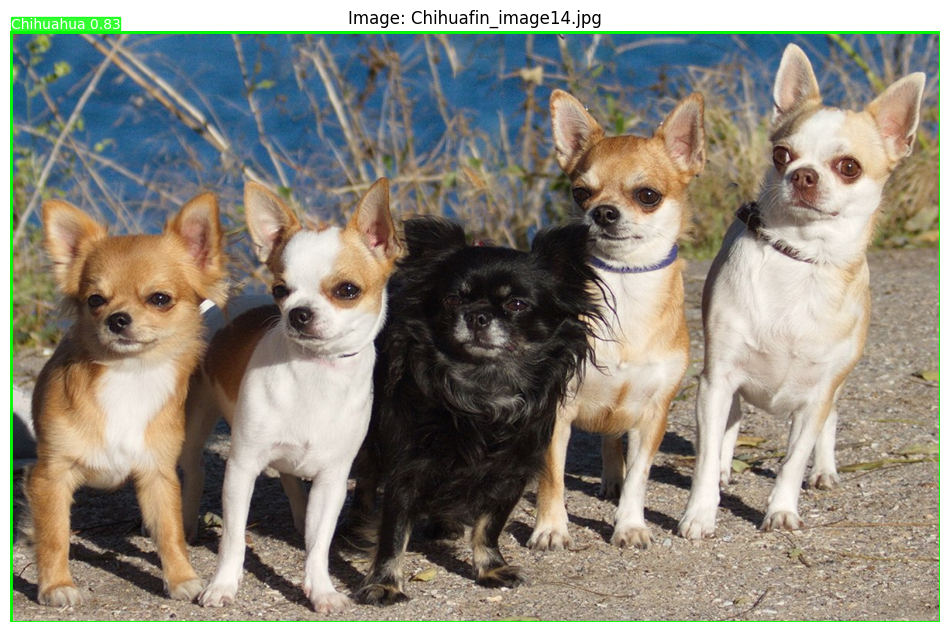


Image: Chihuafin_image14.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.83
  BBox: [x1=0, y1=0, x2=1200, y2=762]
  Size: 1200x762 px


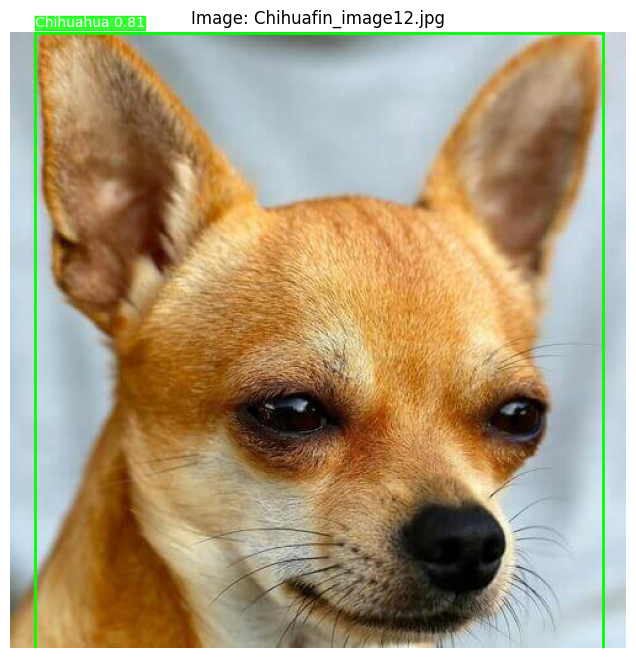


Image: Chihuafin_image12.jpg
Original detections: 2, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.81
  BBox: [x1=20, y1=0, x2=481, y2=500]
  Size: 461x500 px


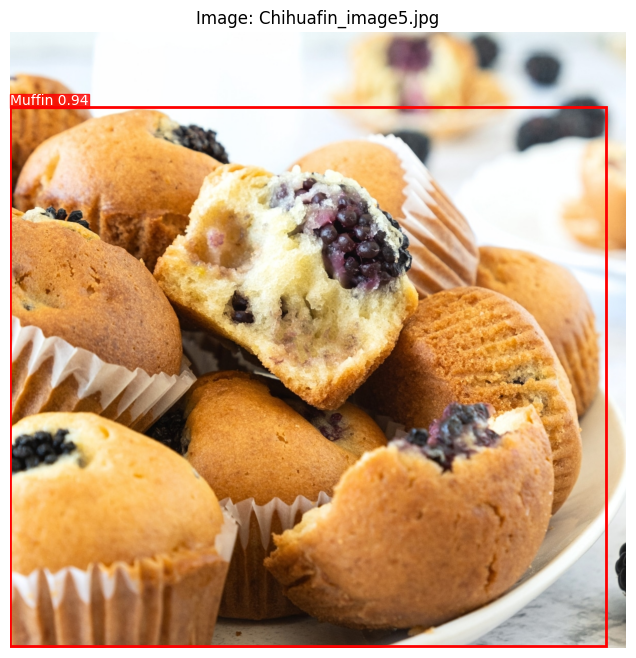


Image: Chihuafin_image5.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.94
  BBox: [x1=0, y1=146, x2=1161, y2=1195]
  Size: 1161x1049 px


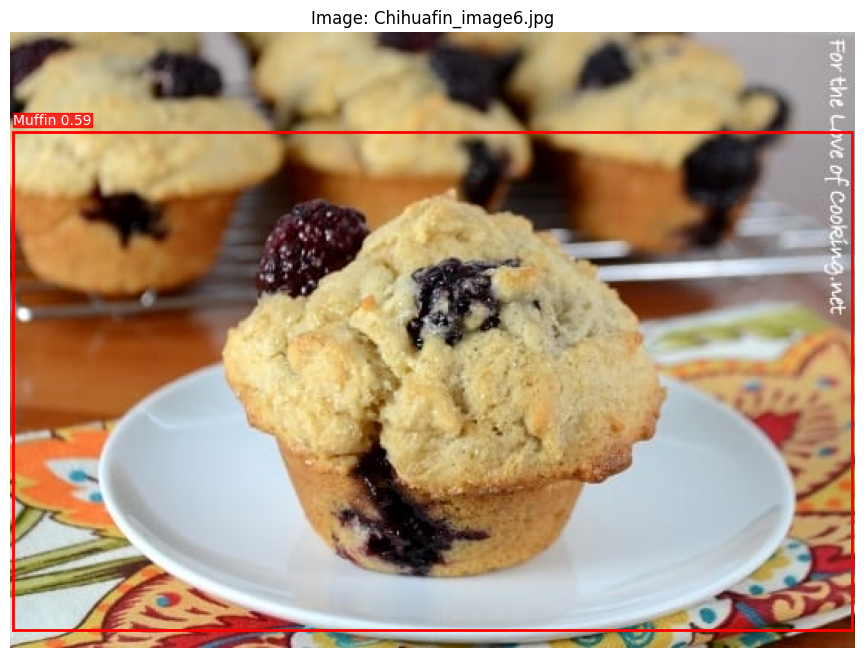


Image: Chihuafin_image6.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.59
  BBox: [x1=2, y1=65, x2=547, y2=389]
  Size: 546x324 px


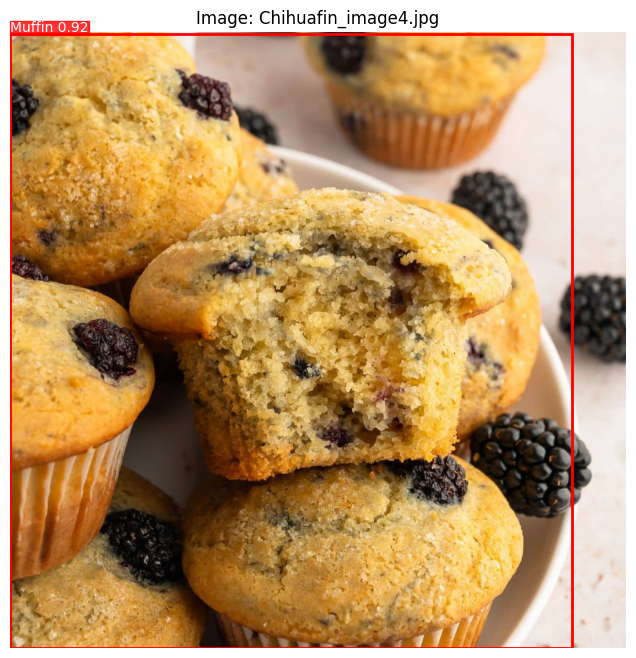


Image: Chihuafin_image4.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.92
  BBox: [x1=0, y1=4, x2=1095, y2=1200]
  Size: 1095x1196 px


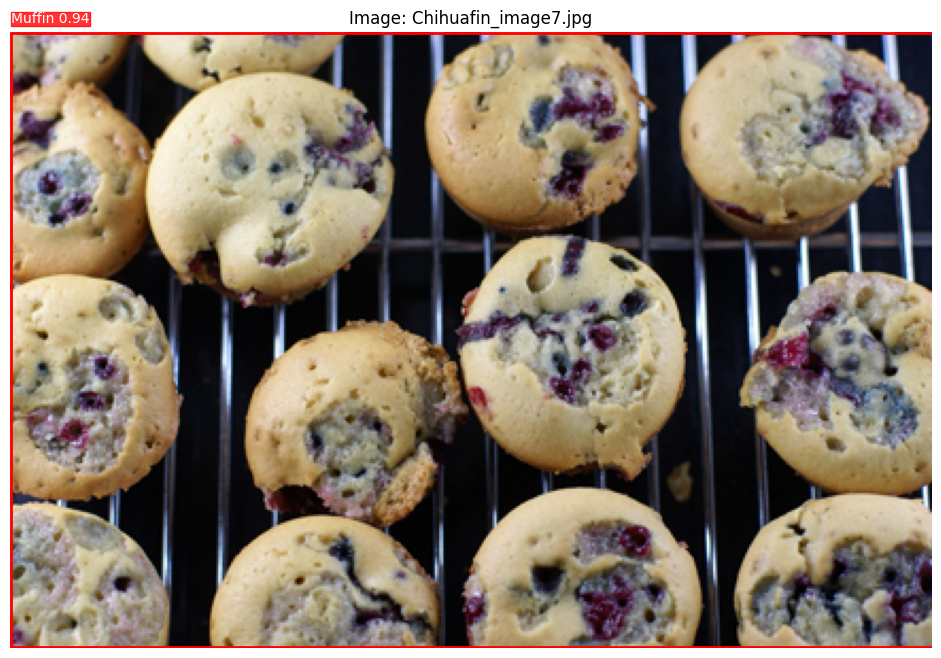


Image: Chihuafin_image7.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.94
  BBox: [x1=0, y1=0, x2=434, y2=289]
  Size: 434x289 px


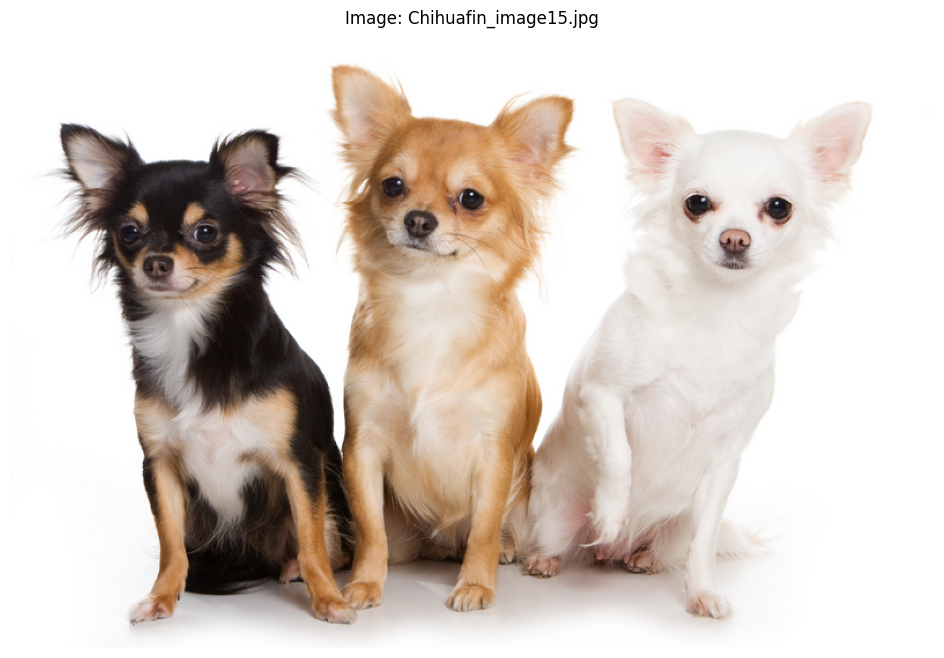


Image: Chihuafin_image15.jpg
Original detections: 0, Merged: 0


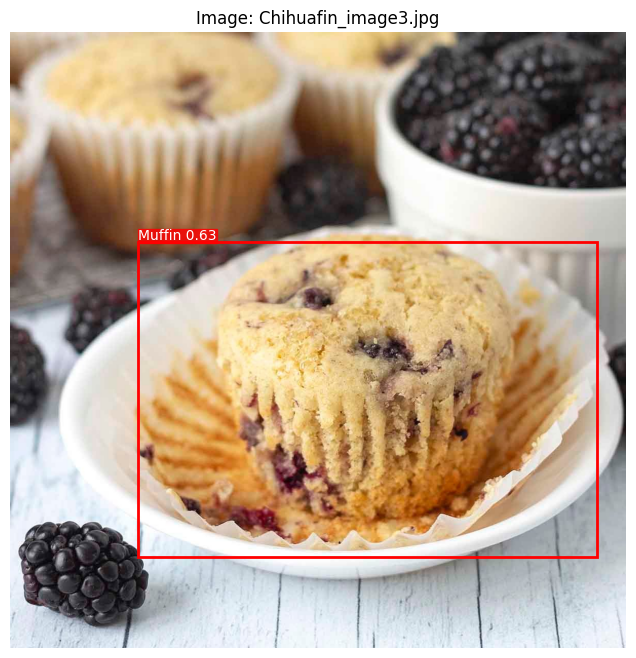


Image: Chihuafin_image3.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.63
  BBox: [x1=249, y1=409, x2=1144, y2=1022]
  Size: 895x613 px


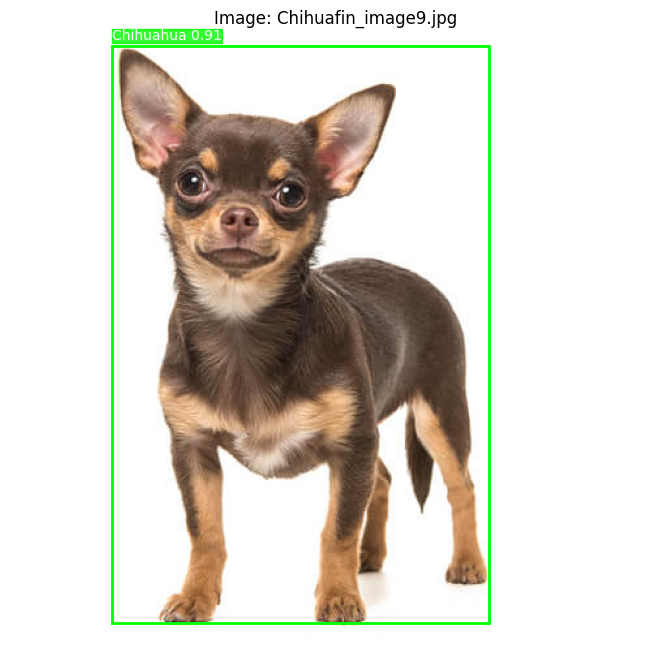


Image: Chihuafin_image9.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.91
  BBox: [x1=78, y1=11, x2=367, y2=453]
  Size: 289x443 px


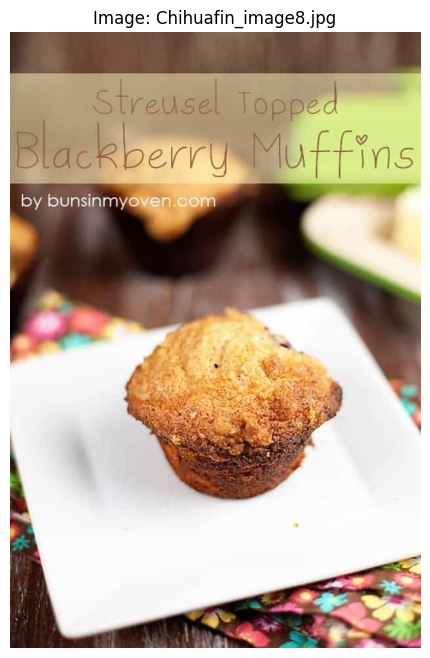


Image: Chihuafin_image8.jpg
Original detections: 0, Merged: 0


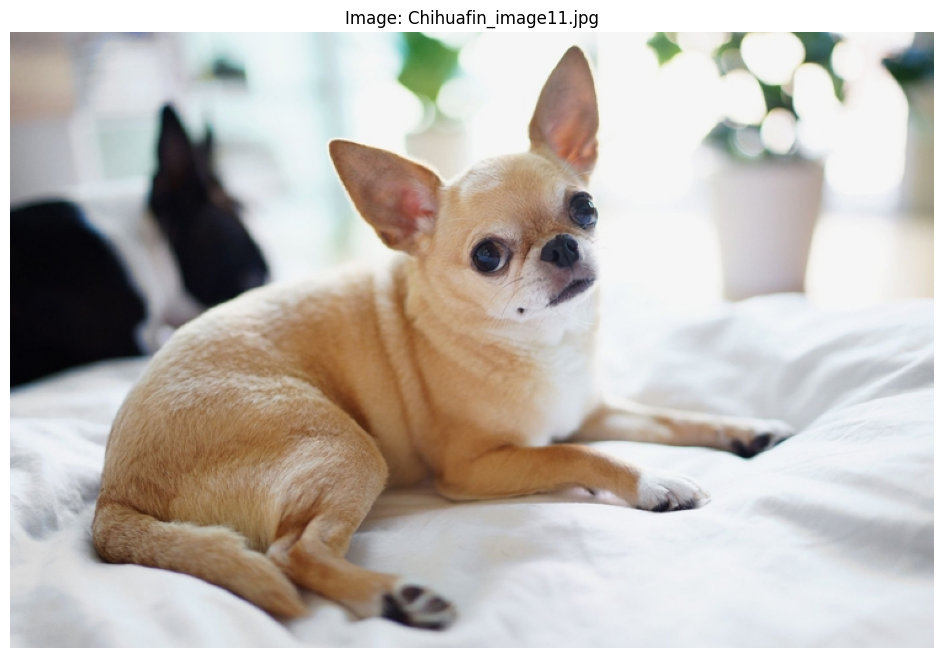


Image: Chihuafin_image11.jpg
Original detections: 0, Merged: 0


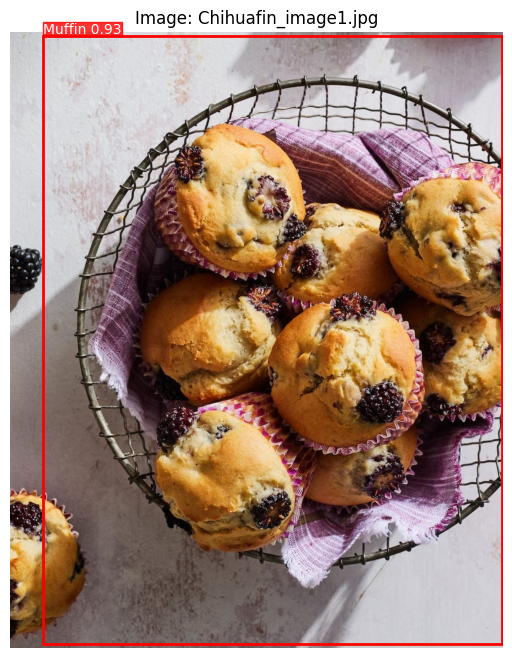


Image: Chihuafin_image1.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.93
  BBox: [x1=58, y1=7, x2=869, y2=1080]
  Size: 811x1073 px


In [17]:
# Пример использования
# classify_images(model, '/content/drive/MyDrive/Colab Notebooks/LB4_test2', num_images=16)

classify_with_saved_weights(
    weights_path='/kaggle/working/model_weights/best.pt',
    image_dir='/kaggle/input/kaggleinputkaggleworkingdatasetlb4-test2/LB4_test2',
    conf_threshold=0.3,
    max_images=16,
    iou_threshold=0.5
)

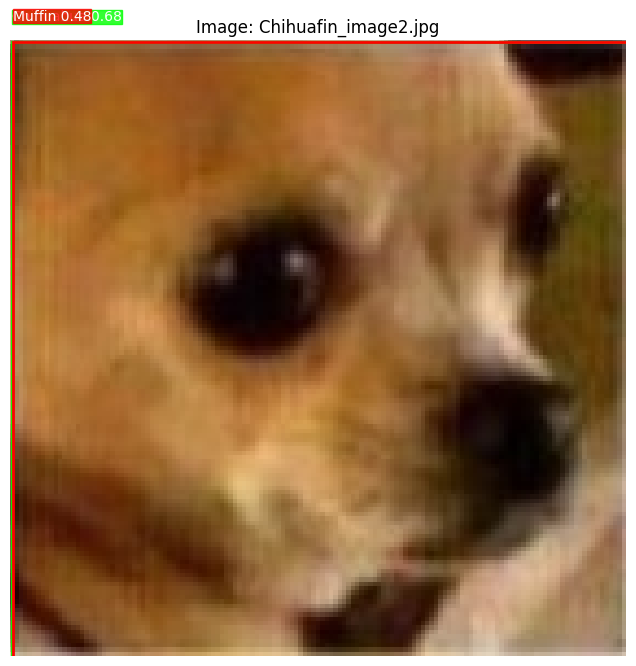


Image: Chihuafin_image2.jpg
Original detections: 2, Merged: 2

Object 1:
  Class: Chihuahua
  Confidence: 0.68
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px

Object 2:
  Class: Muffin
  Confidence: 0.48
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


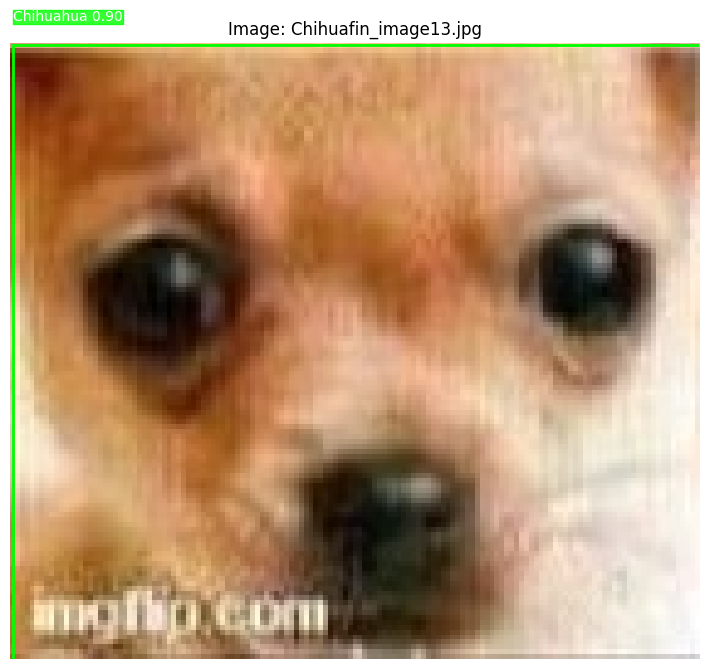


Image: Chihuafin_image13.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.90
  BBox: [x1=0, y1=0, x2=141, y2=126]
  Size: 141x126 px


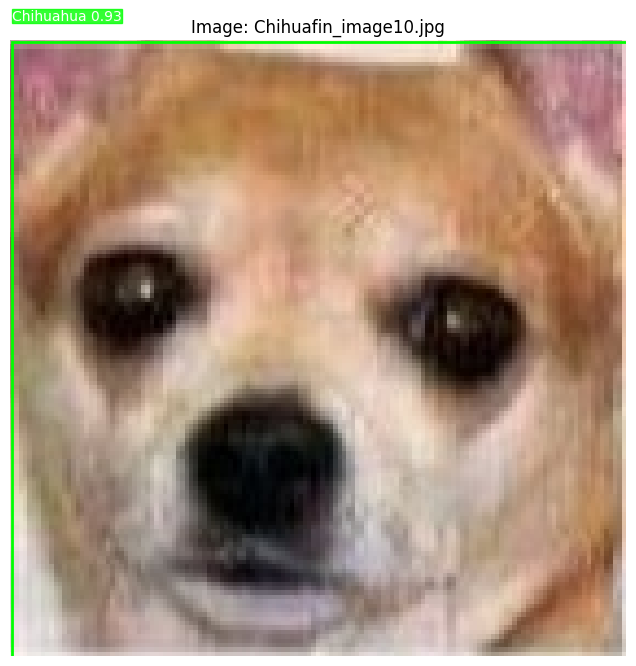


Image: Chihuafin_image10.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.93
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


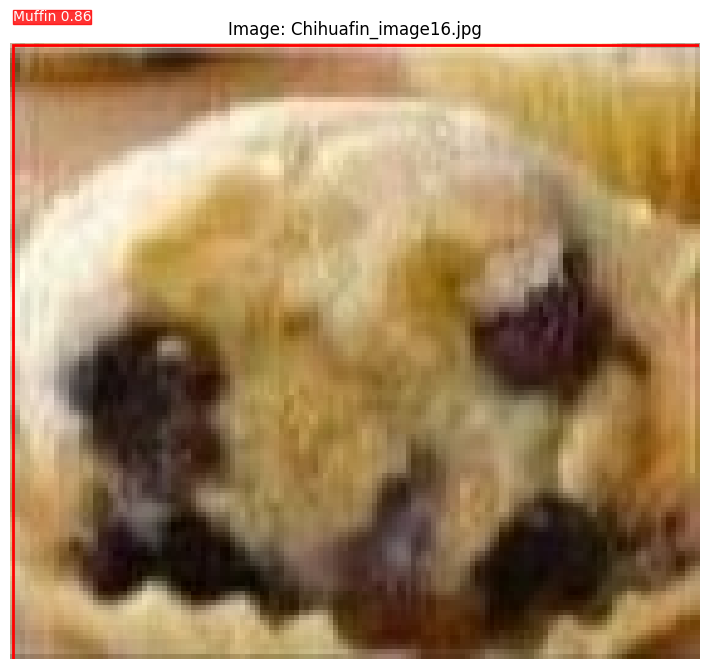


Image: Chihuafin_image16.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.86
  BBox: [x1=0, y1=0, x2=141, y2=126]
  Size: 141x126 px


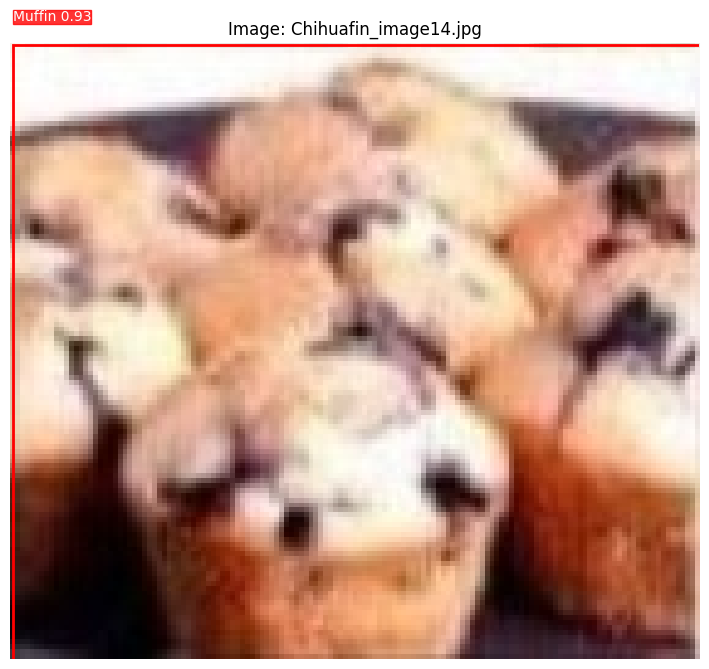


Image: Chihuafin_image14.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.93
  BBox: [x1=0, y1=0, x2=141, y2=126]
  Size: 141x126 px


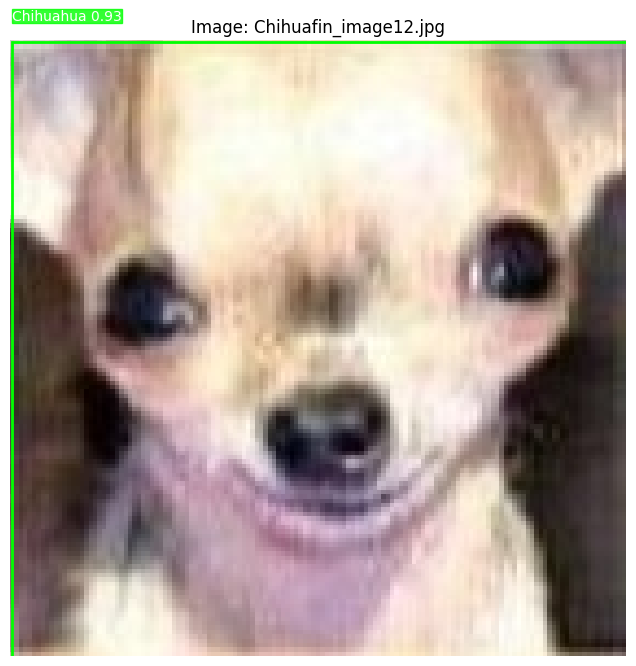


Image: Chihuafin_image12.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.93
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


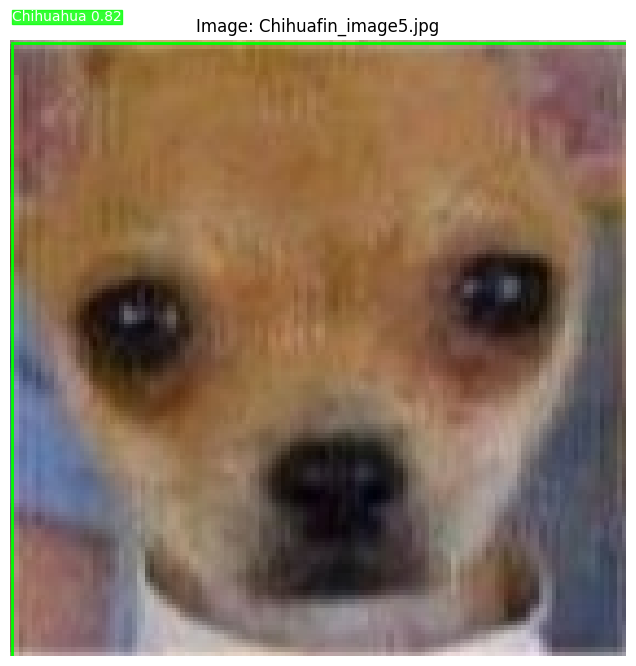


Image: Chihuafin_image5.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.82
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


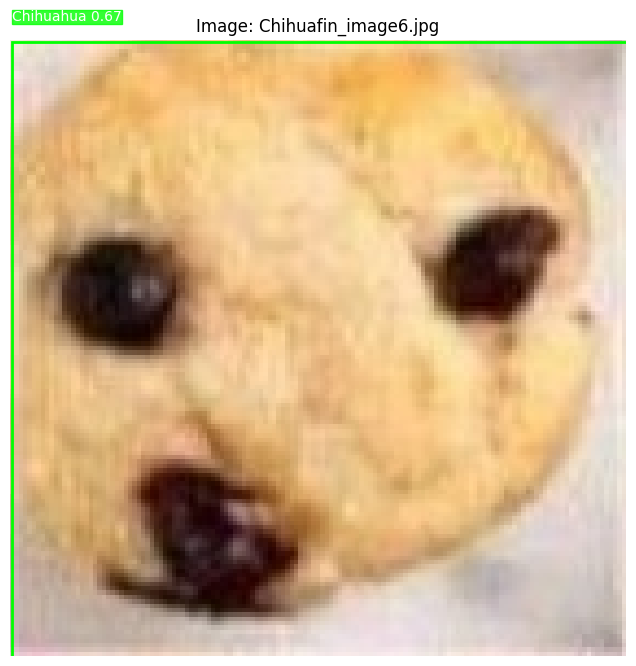


Image: Chihuafin_image6.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.67
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


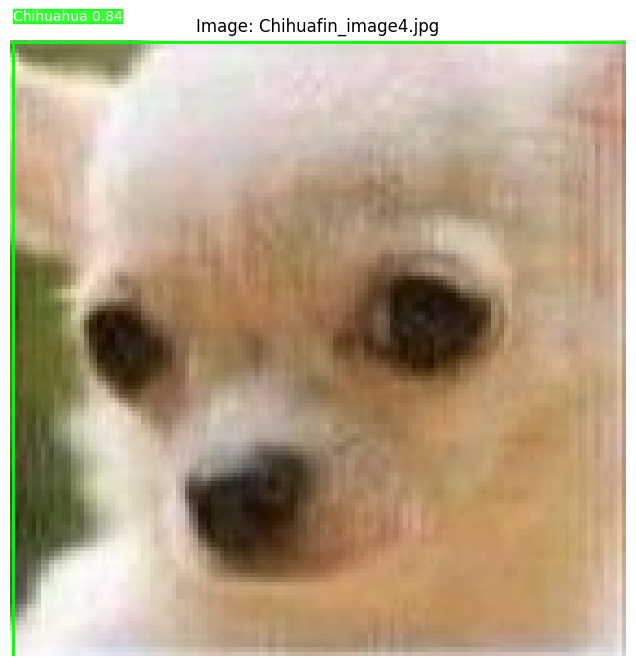


Image: Chihuafin_image4.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.84
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


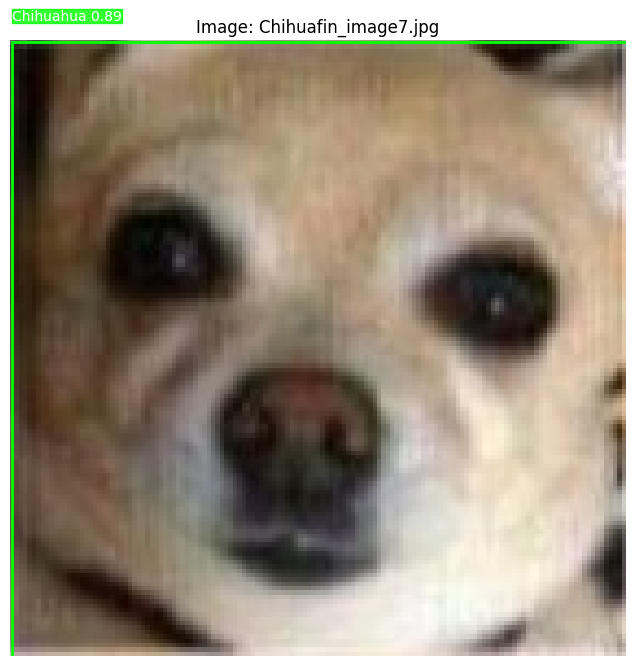


Image: Chihuafin_image7.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.89
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


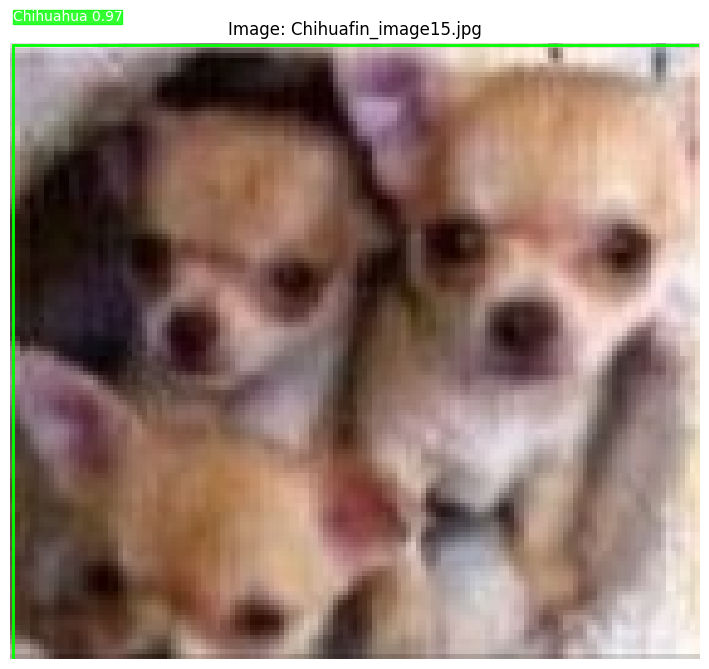


Image: Chihuafin_image15.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Chihuahua
  Confidence: 0.97
  BBox: [x1=0, y1=0, x2=141, y2=126]
  Size: 141x126 px


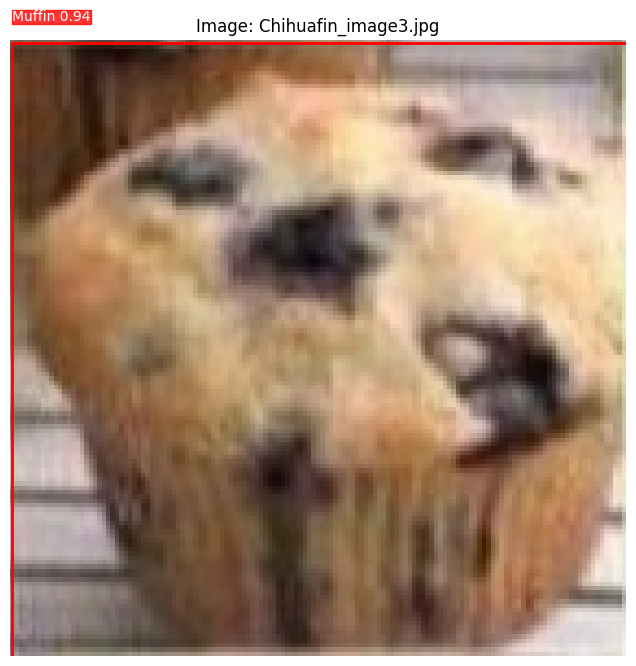


Image: Chihuafin_image3.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.94
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


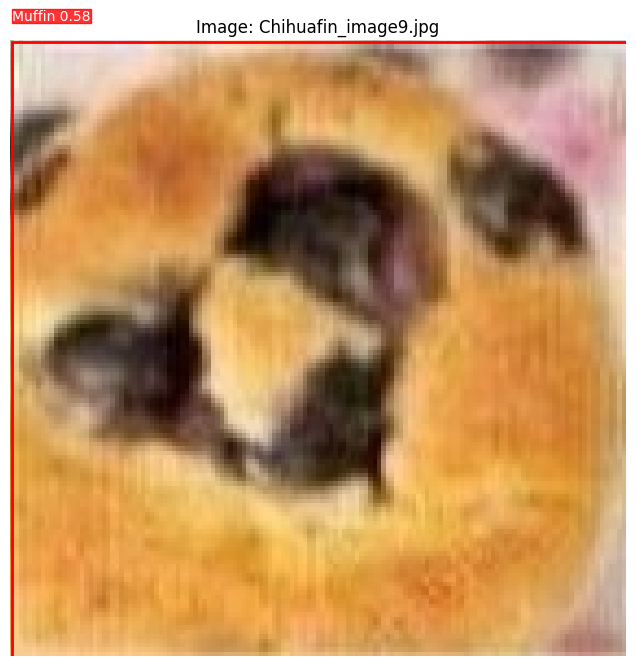


Image: Chihuafin_image9.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.58
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


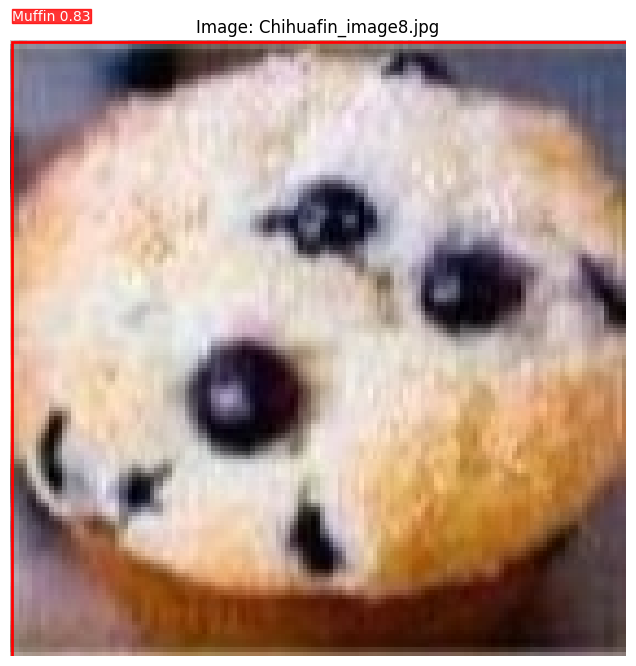


Image: Chihuafin_image8.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.83
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


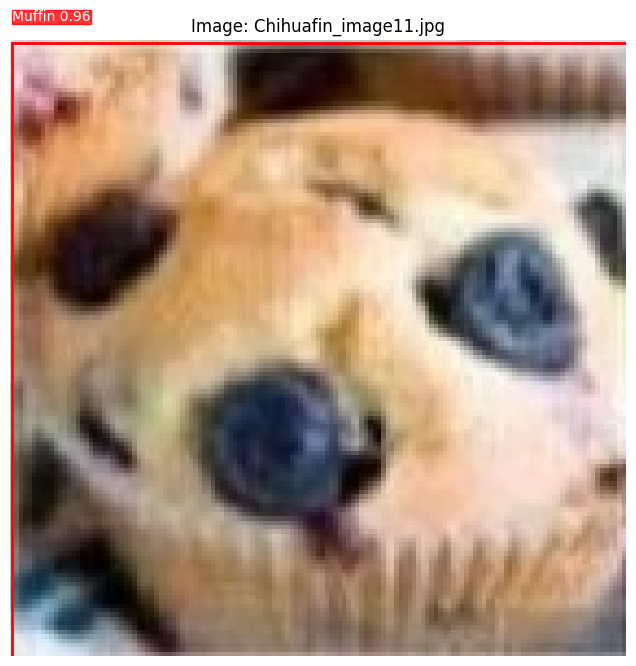


Image: Chihuafin_image11.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.96
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


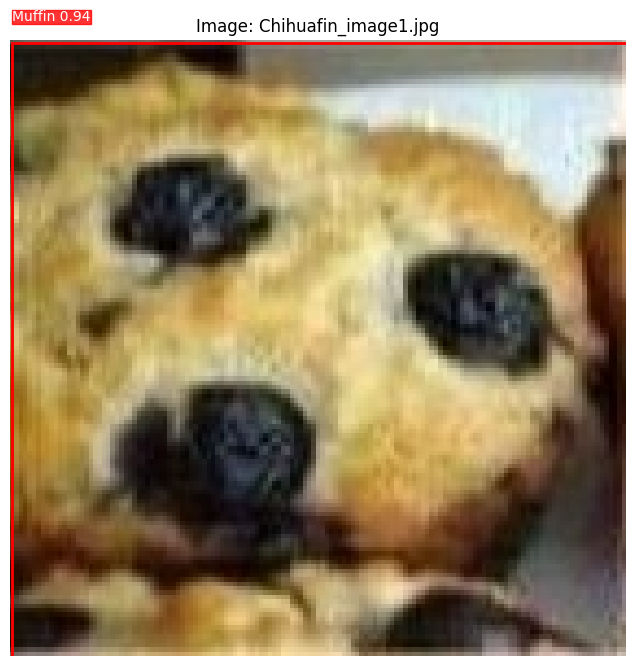


Image: Chihuafin_image1.jpg
Original detections: 1, Merged: 1

Object 1:
  Class: Muffin
  Confidence: 0.94
  BBox: [x1=0, y1=0, x2=141, y2=141]
  Size: 141x141 px


In [18]:
classify_with_saved_weights(
    weights_path='/kaggle/working/model_weights/best.pt',
    image_dir='/kaggle/input/kaggleinputkaggleworkingdatasetlb4-test1/LB4_test1',
    conf_threshold=0.3,
    max_images=16,
    iou_threshold=0.5
)